# Author

- Kevin Christian (https://www.linkedin.com/in/kevinchs0808/)

# Install Libraries

In [1]:
!pip3 install neo4j
!pip3 install networkx
!pip3 install pandas
!pip3 install tqdm
!pip3 install matplotlib
!pip3 install seaborn
!pip3 install neo4jupyter
!pip3 install scipy

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


# Import Libraries

In [2]:
from neo4j import GraphDatabase
import networkx as nx
import pandas as pd
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import neo4jupyter

# Start a Neo4j Docker Instance

## Docker Setup

If you do not have Docker Desktop in your computer, I would recommend you to download and setup the Docker Desktop using the instructions from https://www.docker.com/products/docker-desktop/

## Pull Neo4j Docker Image

- Open a terminal / command prompt
- type the following command in your terminal / command prompt: docker pull neo4j

## Start a new local instance

- type the following command in your terminal / command prompt: docker run --name (any-name) -p7474:7474 -p7687:7687 --env NEO4J_AUTH=(username)/(password) neo4j:latest
- Please replace (any-name), (username), (password); with any value that you want

# Neo4j Connection Class

In [3]:
class Neo4jConnection:
    ''' To create a connection with an active Neo4j Database Instance

    Attributes:
        __uri (str): The URL of the Neo4j Database Instance
        __user (str): The username of the Neo4j Database Instance owner
        __pwd (str): The password of the Neo4j Database Instance owner
        __driver (neo4j.GraphDatabase): The Neo4j Database Instance

    Methods:
        __init__(uri, user, pwd): To create the Neo4jConnection Class
        close(): To close the Neo4j Database Connection
        query(query: str, parameters=None, db=None): To perform analytics on the Neo4j Graph Database Instance based on the query and parameters the user provides
    
    '''
    
    def __init__(self, uri: str, user: str, pwd: str) -> None:
        ''' To create the Neo4jConnection Class

        Args:
            uri (str): The URL of the Neo4j Database Instance
            user (str): The username of the Neo4j Database Instance owner
            pwd (str): The password of the Neo4j Database Instance owner
            
        Returns:
            None
            
        '''
        
        self.__uri = uri
        self.__user = user
        self.__pwd = pwd
        self.__driver = None

        # Try to initialize the Neo4j Database Instance
        try:
            self.__driver = GraphDatabase.driver(self.__uri, auth=(self.__user, self.__pwd))

        # If it does not work, throw an error
        except Exception as e:
            print("Failed to create the driver:", e)
        
    def close(self) -> None:
        ''' To close the Neo4j Database Connection

        Args:
            None

        Returns:
            None
            
        '''

        # Close the driver if it is active
        if self.__driver is not None:
            self.__driver.close()
        
    def query(self, query: str, parameters: dict = None, db: str = None):
        ''' To perform analytics on the Neo4j Graph Database Instance based on the query and parameters the user provides

        Args:
            query (str): The Cypher instructions for obtaining the requested information
            parameters (dict): The set of supporting information for achieving the query result
            db (str): The database name

        Returns:
            None
            
        '''

        # Make sure that the Neo4j Driver has been initialized
        assert self.__driver is not None, "Driver not initialized!"
        session = None
        response = None

        # Try to get the querying result
        try: 
            session = self.__driver.session(database=db) if db is not None else self.__driver.session() 
            response = list(session.run(query, parameters))

        # If it failed, throw an error
        except Exception as e:
            print("Query failed:", e)

        # Always close the session's connection regardless of the querying result
        finally: 
            if session is not None:
                session.close()
                
        return response

# Create A New Connection to a Neo4j Docker Instance

In [4]:
conn = Neo4jConnection(uri="bolt://0.0.0.0:7687", 
                       user="neo4j",              
                       pwd="12345678")

# Import The Dataset

In [5]:
##################################################################################################################################################################################################################
# CREDIT:
#   - S. Kumar, F. Spezzano, V.S. Subrahmanian, C. Faloutsos. Edge Weight Prediction in Weighted Signed Networks. IEEE International Conference on Data Mining (ICDM), 2016.
#   - S. Kumar, B. Hooi, D. Makhija, M. Kumar, V.S. Subrahmanian, C. Faloutsos. REV2: Fraudulent User Prediction in Rating Platforms. 11th ACM International Conference on Web Searchand Data Mining (WSDM), 2018.
##################################################################################################################################################################################################################

file = "./soc-sign-bitcoinalpha.csv.gz"

df = pd.read_csv(file, compression='gzip', names = ["SOURCE", "TARGET", "RATING", "TIME"], header=None)
df.head()

,SOURCE,TARGET,RATING,TIME
0,7188,1,10,1407470400
1,430,1,10,1376539200
2,3134,1,10,1369713600
3,3026,1,10,1350014400
4,3010,1,10,1347854400


# Define The Node Constraint

In [6]:
conn.query('CREATE CONSTRAINT users IF NOT EXISTS FOR (u:User) REQUIRE u.id IS UNIQUE')

[]

# Define Functions for Adding Nodes + Edges

In [7]:
def add_source(records):
    # Adds source nodes to the Neo4j graph.
  
    query = '''UNWIND $rows AS row
    MERGE (source:User {id: row.SOURCE})
    RETURN count(*)
    '''
    
    return conn.query(query, parameters={'rows': records.to_dict('records')})

def add_target(records):
    # Adds target nodes to the Neo4j graph.
  
    query = '''UNWIND $rows AS row
    MERGE (target:User {id: row.TARGET})
    RETURN count(*)
    '''
    
    return conn.query(query, parameters={'rows': records.to_dict('records')})

def add_trust_edge(records):
    # Adds directed and weighted ratings from (source to target) to the Neo4j graph.
  
    query = '''UNWIND $rows AS row
    MATCH (source:User {id: row.SOURCE})
    MATCH (target:User {id: row.TARGET})
    MERGE (source)-[:TRUST {weight: toInteger(row.RATING)}]->(target)
    RETURN count(*)
    '''
    
    return conn.query(query, parameters={'rows': records.to_dict('records')})

# Add Nodes + Edges

In [8]:
add_source(df)

[<Record count(*)=24186>]

In [9]:
add_target(df)

[<Record count(*)=24186>]

In [10]:
add_trust_edge(df)

[<Record count(*)=24186>]

# Potential Trustworthy Users

At first glance, the easiest way to find the most trustworthy users is to find those users who have the highest ratings sum. However, what if some users deliberately assign false ratings to make it harder for fraud detection?

In [11]:
trustworthy_string = '''
MATCH (c:User) 
MATCH ()-[r]->(c)
RETURN c.id, sum(r.weight) AS Trust_Value
ORDER BY Trust_Value DESC LIMIT 10
'''

trustworthy_df = pd.DataFrame([dict(_) for _ in conn.query(trustworthy_string)])
trustworthy_df.head(10)

,c.id,Trust_Value
0,1,758
1,2,735
2,3,610
3,4,588
4,5,390
5,6,388
6,7,370
7,8,345
8,9,321
9,10,288


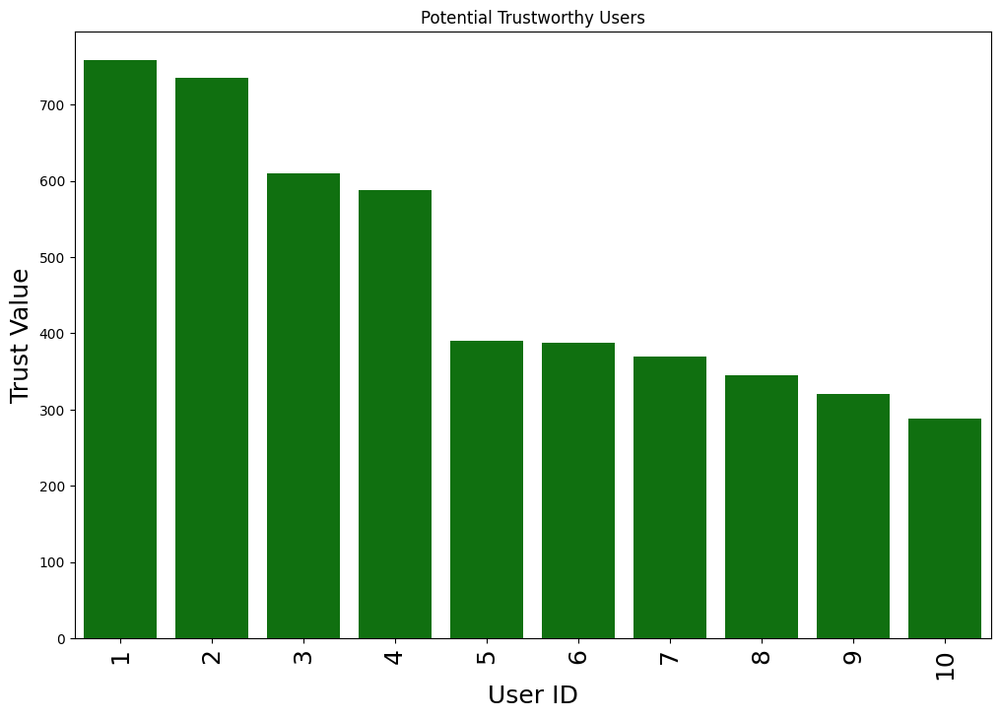

In [12]:
plt.figure(figsize=(12,8))
sns.barplot(x=trustworthy_df['c.id'], y=trustworthy_df['Trust_Value'], color='green')
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Trust Value',fontsize=18)
plt.xticks(rotation='vertical', fontsize=18)
plt.title("Potential Trustworthy Users")
plt.show()

# Potential Fraudulent User

At first glance, the easiest way to find the most fraudulent users is to find those users who have the lowest ratings sum. However, what if some users deliberately assign false ratings to make it harder for fraud detection?

In [13]:
fraudulent_string = '''
MATCH (c:User) 
MATCH ()-[r]->(c)
RETURN c.id, sum(r.weight) AS Trust_Value
ORDER BY Trust_Value LIMIT 10
'''

fraudulent_df = pd.DataFrame([dict(_) for _ in conn.query(fraudulent_string)])
fraudulent_df.head(10)

,c.id,Trust_Value
0,7604,-628
1,7603,-213
2,7602,-150
3,7601,-120
4,7600,-119
5,7598,-110
6,7599,-110
7,7597,-90
8,7596,-69
9,7595,-64


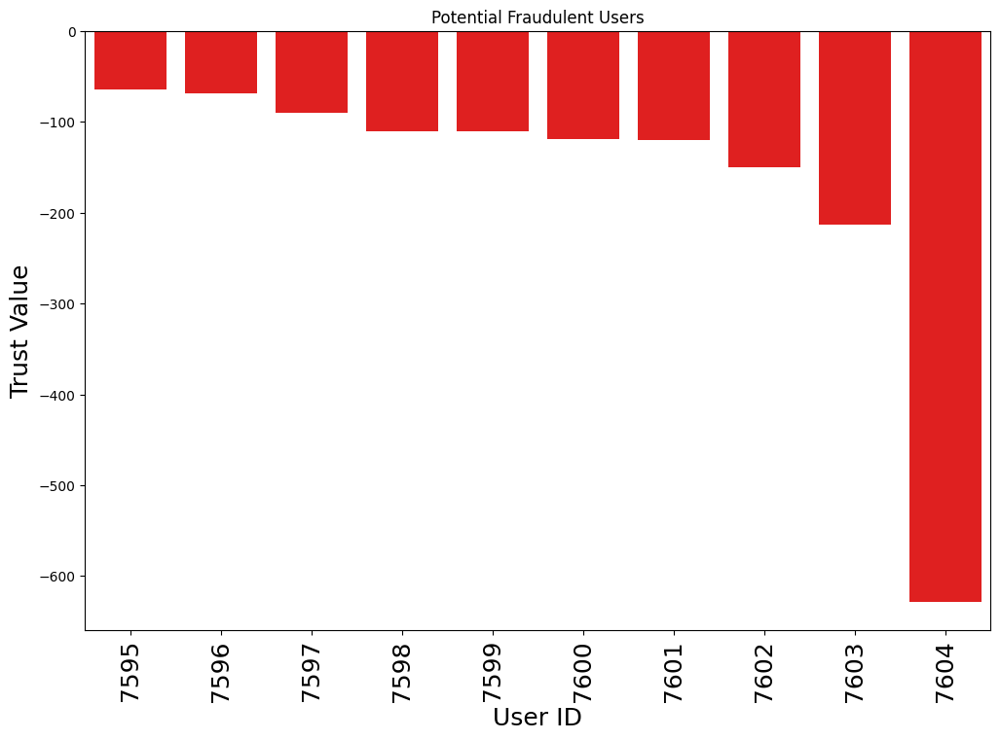

In [14]:
plt.figure(figsize=(12,8))
sns.barplot(x=fraudulent_df['c.id'], y=fraudulent_df['Trust_Value'], color='red')
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Trust Value',fontsize=18)
plt.xticks(rotation='vertical', fontsize=18)
plt.title("Potential Fraudulent Users")
plt.show()

# Overall Visualization

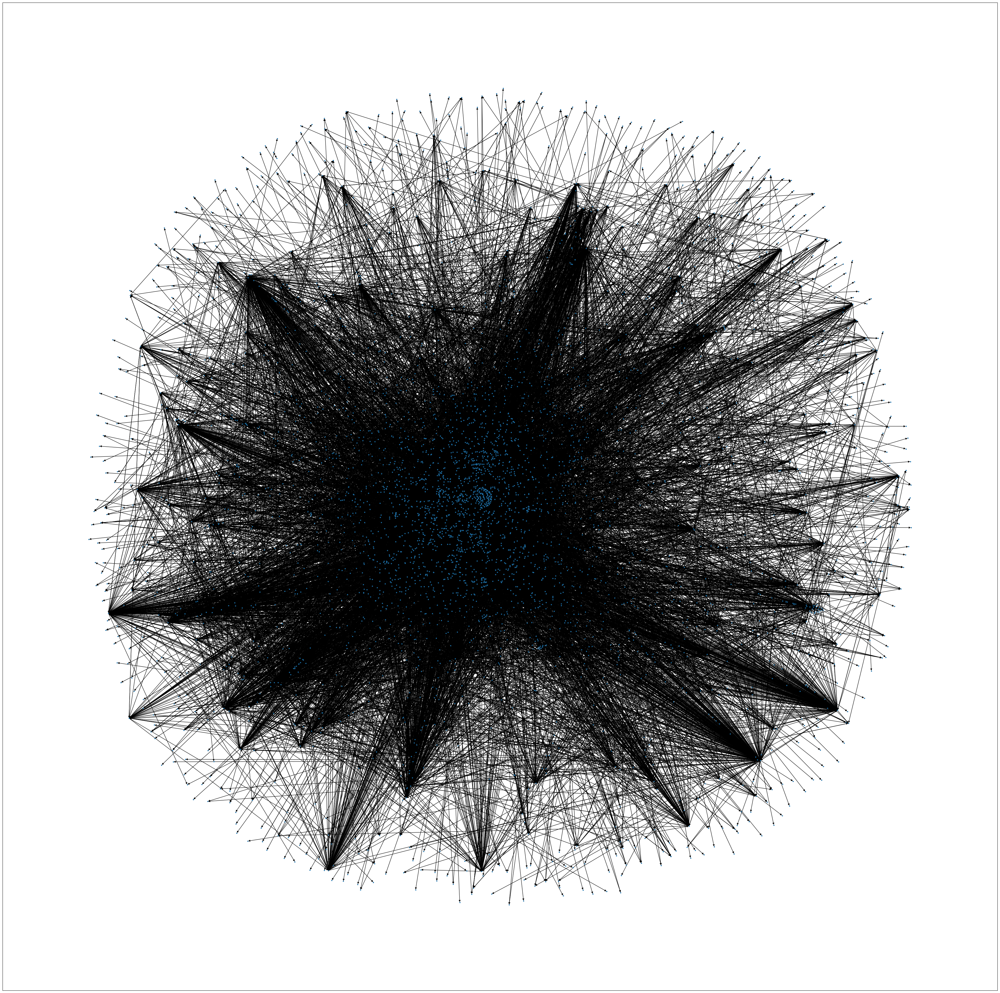

In [15]:
G = nx.DiGraph(directed=True)

plt.figure(figsize=(50,50))

for i in range(df.shape[0]):
    source = df.loc[i, "SOURCE"]
    target = df.loc[i, "TARGET"]
    weight = df.loc[i, "RATING"]
    G.add_edges_from([(source, target)], weight=weight)

nx.draw_networkx(G, arrows=True, node_size=5,font_size=1)

plt.show()